In [ ]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"


import numpy as np
import tensorflow as tf
import keras

import cv2
from PIL import Image

import matplotlib as mpl
import matplotlib.pyplot as plt

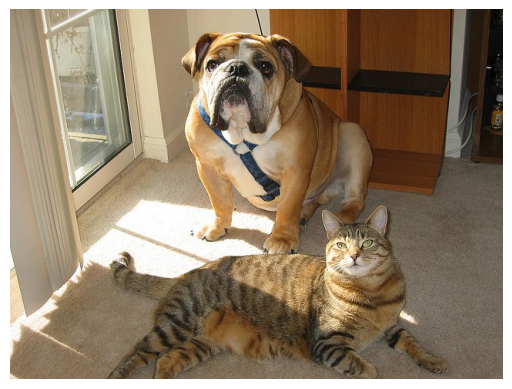

In [ ]:
os.chdir('/content/drive/MyDrive/GradCam/TestImages')

image_path = 'catdog.jpg'
image = Image.open(image_path)

plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
def get_img_array(img_path, size):
    img = keras.utils.load_img(img_path, target_size=size)

    array = keras.utils.img_to_array(img)

    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):

    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )


    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]


    grads = tape.gradient(class_channel, last_conv_layer_output)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [ ]:
def get_processed_heatmap(heatmap, img):
    heatmap = np.uint8(255 * heatmap)

    jet = mpl.colormaps["jet"]

    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    #first_channel = jet_heatmap[:, :, 0]
    #jet_heatmap[first_channel == 0] = [0,0,0]

    return jet_heatmap

def save_and_display_gradcam(img_path, jet_heatmap, cam_path="cam.jpg", alpha=0.9):

    im = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(im)

    #jet_heatmap=get_processed_heatmap(heatmap, img)

    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    superimposed_img.save(cam_path)

    image = Image.open(cam_path)

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(im)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(image)
    plt.axis('off')
    plt.show()

In [ ]:
model_builder = keras.applications.vgg16.VGG16
img_size = (224, 224)
preprocess_input = keras.applications.vgg16.preprocess_input
decode_predictions = keras.applications.vgg16.decode_predictions

last_conv_layer_name = "block5_conv3"

In [ ]:
img_path="catdog.jpg"
img=get_img_array(img_path, size=img_size)
img_array=keras.utils.img_to_array(keras.utils.load_img(img_path))
preprocessed_img = preprocess_input(img)

model = model_builder(weights="imagenet")

model.layers[-1].activation = None

preds = model.predict(preprocessed_img)
sorted_indices = np.argsort(preds[0])[::-1]
decoded=decode_predictions(preds, top=5)[0]
print("Predicted:", decoded)

35363/35363 [==============================] - 0s 3us/step
Predicted: [('n02108422', 'bull_mastiff', 14.053507), ('n02108089', 'boxer', 13.997361), ('n02109047', 'Great_Dane', 11.75679), ('n02109525', 'Saint_Bernard', 11.403601), ('n02129604', 'tiger', 11.023391)]


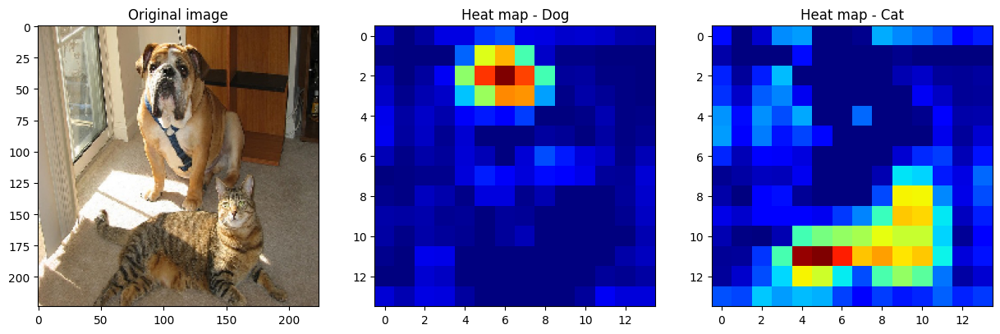

In [ ]:
heatmap1 = make_gradcam_heatmap(preprocessed_img, model, last_conv_layer_name, 242)
heatmap2 = make_gradcam_heatmap(preprocessed_img, model, last_conv_layer_name, 281)

plt.figure(figsize=(15, 10))

plt.subplot(131)
plt.title('Original image')
plt.imshow(keras.utils.load_img(img_path, target_size=img_size))

plt.subplot(132)
plt.title('Heat map - Dog')
plt.imshow(heatmap1, cmap='jet')

plt.subplot(133)
plt.title('Heat map - Cat')
plt.imshow(heatmap2, cmap='jet')
plt.show()

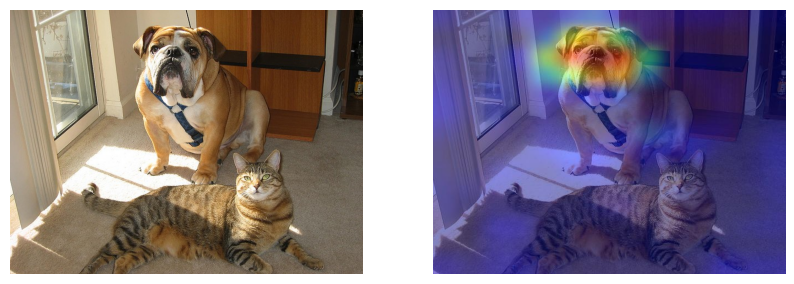

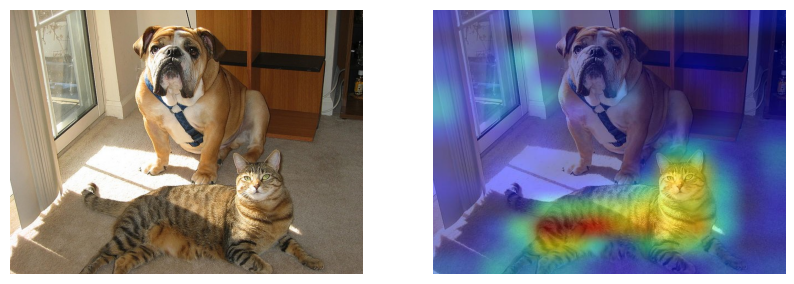

In [ ]:
jet_heatmap_1=get_processed_heatmap(heatmap1, img_array)
jet_heatmap_2=get_processed_heatmap(heatmap2, img_array)
save_and_display_gradcam(img_path, jet_heatmap_1, cam_path="result_dog.jpg")
save_and_display_gradcam(img_path, jet_heatmap_2, cam_path="result_cat.jpg")

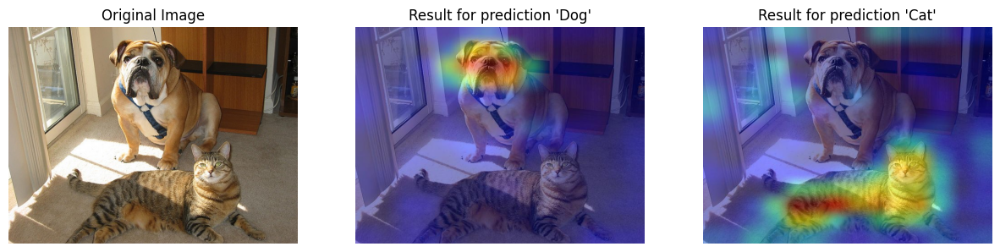

In [ ]:
result_dog = Image.open('result_dog.jpg')
result_cat = Image.open('result_cat.jpg')

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(result_dog)
plt.title("Result for prediction 'Dog'")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(result_cat)
plt.title("Result for prediction 'Cat'")
plt.axis('off')

plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!pip install innvestigate --default-timeout=100 future

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 489.9/489.9 MB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 80.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 41.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 72.4 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.15.0
    Uninstalling tensorflow-estimator-2.15.0:
      Successfully uninstalled tensorflow-estimator-2.15.0
  Attempting uninstall: keras
    Found existing installation: keras 2.15.0
    Uninstalling keras-2.15.0:
      Successfully uninstalled keras-2.15.0
  Attempting uninstall: google-auth-oauthlib
    Found existing installation: google-auth-oauthlib 1.2.0
    Uninstalling google-auth-oauthlib-1.2.0:
      Successfully uninstalled google-auth-oauthlib-1.2.0
  Attempting uninstall: ten

In [ ]:
vgg_model = model_builder(weights="imagenet")
preprocessed_img = preprocess_input(get_img_array(img_path, size=img_size))

import innvestigate
tf.compat.v1.disable_eager_execution()

model_wo_sm = innvestigate.model_wo_softmax(vgg_model)


In [ ]:
channels_first = keras.backend.image_data_format() == "channels_first"
color_conversion = "BGRtoRGB"  # keras.applications use BGR format

import innvestigate.utils as iutils
import innvestigate.utils.visualizations as ivis

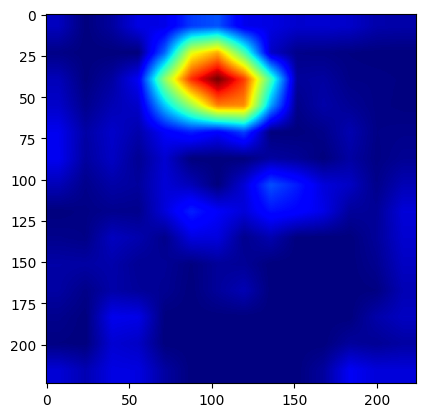

In [ ]:
gcam_heatmap = cv2.resize(heatmap1, dsize=(224, 224),
                         interpolation=cv2.INTER_LINEAR)

gcam_heatmap /= np.max(np.abs(gcam_heatmap))
gcam_mask=np.repeat(gcam_heatmap[:, :, np.newaxis], 3, axis=2)
batch_gcam_mask = np.expand_dims(gcam_mask, axis=0)

plt.imshow(gcam_heatmap, cmap='jet')
plt.show()

In [ ]:
gb_analyzer = innvestigate.create_analyzer("guided_backprop", model_wo_sm)

gb_a = gb_analyzer.analyze(preprocessed_img)

gb_a_single = iutils.postprocess_images(gb_a, color_conversion, channels_first)
gb_a_single = ivis.project(ivis.clip_quantile(gb_a_single, 1))


# gcam_gb = iutils.postprocess_images(gb_a, color_conversion, channels_first)
# gcam_gb = ivis.heatmap(gb_a*batch_gcam_mask)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


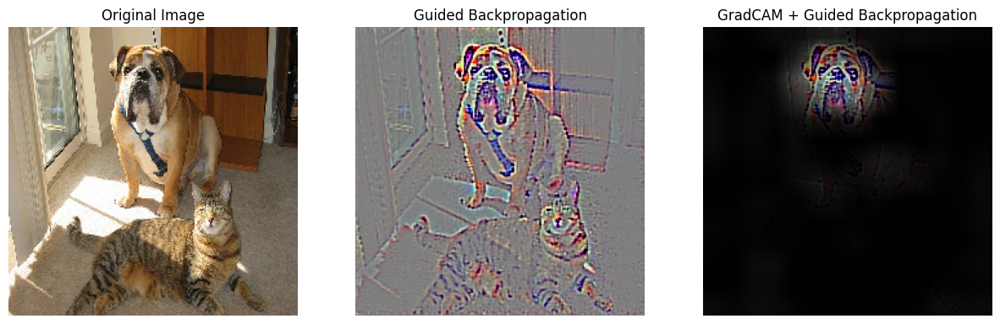

In [ ]:
plt.figure(figsize=(15, 10))

plt.subplot(131)
plt.title('Original Image')
plt.axis('off')
plt.imshow(keras.utils.load_img(img_path, target_size=img_size))

plt.subplot(132)
plt.title('Guided Backpropagation')
plt.axis('off')
plt.imshow(gb_a_single[0])

plt.subplot(133)
plt.title('GradCAM + Guided Backpropagation')
plt.axis('off')
plt.imshow(gb_a_single[0]*gcam_mask)
plt.show()

In [ ]:
dt_analyzer = innvestigate.create_analyzer("deep_taylor", model_wo_sm)

dt_a = dt_analyzer.analyze(preprocessed_img)

dt_a_single = iutils.postprocess_images(dt_a, color_conversion, channels_first)
dt_a_single = ivis.heatmap(dt_a_single)

gcam_dt=dt_a*batch_gcam_mask
gcam_dt = iutils.postprocess_images(gcam_dt, color_conversion, channels_first)
gcam_dt = ivis.heatmap(gcam_dt)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


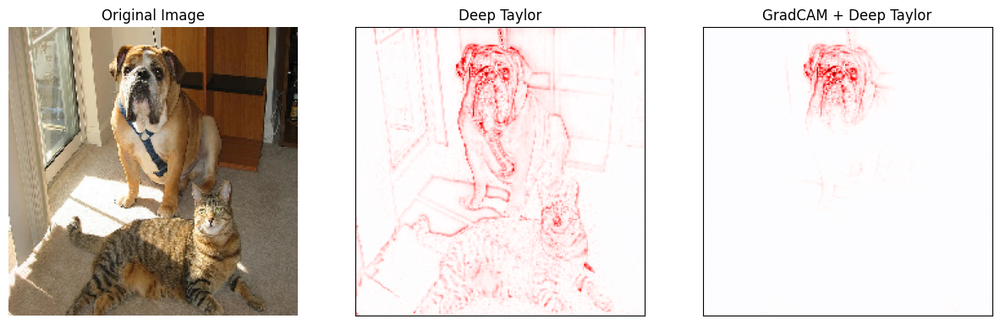

In [ ]:
plt.figure(figsize=(15, 10))

plt.subplot(131)
plt.title('Original Image')
plt.axis('off')
plt.imshow(keras.utils.load_img(img_path, target_size=img_size))

plt.subplot(132)
plt.title('Deep Taylor')
plt.xticks([])
plt.yticks([])
plt.imshow(dt_a_single[0])

plt.subplot(133)
plt.title('GradCAM + Deep Taylor')
plt.xticks([])
plt.yticks([])
plt.imshow(gcam_dt[0])
plt.show()

In [ ]:
lrp_epsilon_analyzer = innvestigate.create_analyzer("lrp.epsilon", model_wo_sm, epsilon=1)

lrp_epsilon_a = lrp_epsilon_analyzer.analyze(preprocessed_img)

lrp_epsilon_a_single = iutils.postprocess_images(lrp_epsilon_a, color_conversion, channels_first)
lrp_epsilon_a_single = ivis.heatmap(lrp_epsilon_a_single)

gradcam_lrp_epsilon=lrp_epsilon_a*batch_gcam_mask

gradcam_lrp_epsilon = iutils.postprocess_images(gradcam_lrp_epsilon, color_conversion, channels_first)
gradcam_lrp_epsilon = ivis.heatmap(gradcam_lrp_epsilon)

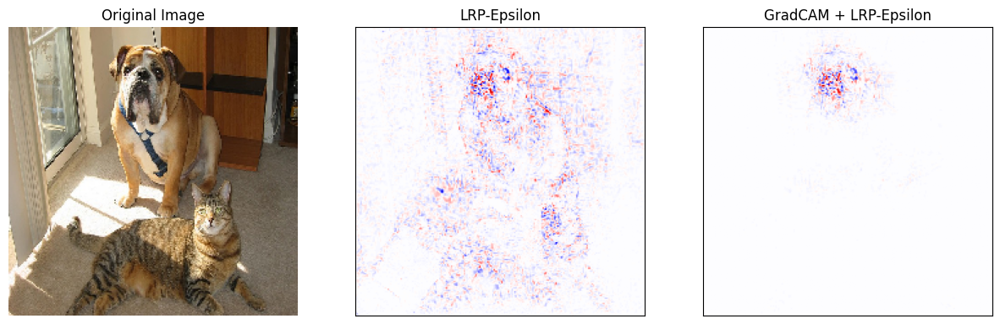

In [ ]:
plt.figure(figsize=(15, 10))

plt.subplot(131)
plt.title('Original Image')
plt.axis('off')
plt.imshow(keras.utils.load_img(img_path, target_size=img_size))

plt.subplot(132)
plt.title('LRP-Epsilon')
plt.xticks([])
plt.yticks([])
plt.imshow(lrp_epsilon_a_single[0])

plt.subplot(133)
plt.title('GradCAM + LRP-Epsilon')
plt.xticks([])
plt.yticks([])
plt.imshow(gradcam_lrp_epsilon[0])

plt.show()

In [ ]:
lrp_a_flat_analyzer = innvestigate.create_analyzer("lrp.alpha_2_beta_1", model_wo_sm)

lrp_a_flat_a = lrp_a_flat_analyzer.analyze(preprocessed_img)

lrp_a_flat_a_single = iutils.postprocess_images(lrp_a_flat_a, color_conversion, channels_first)
lrp_a_flat_a_single = ivis.heatmap(lrp_a_flat_a_single)

gradcam_lrp_a_flat=lrp_a_flat_a*batch_gcam_mask

gradcam_lrp_a_flat = iutils.postprocess_images(gradcam_lrp_a_flat, color_conversion, channels_first)
gradcam_lrp_a_flat = ivis.heatmap(gradcam_lrp_a_flat)

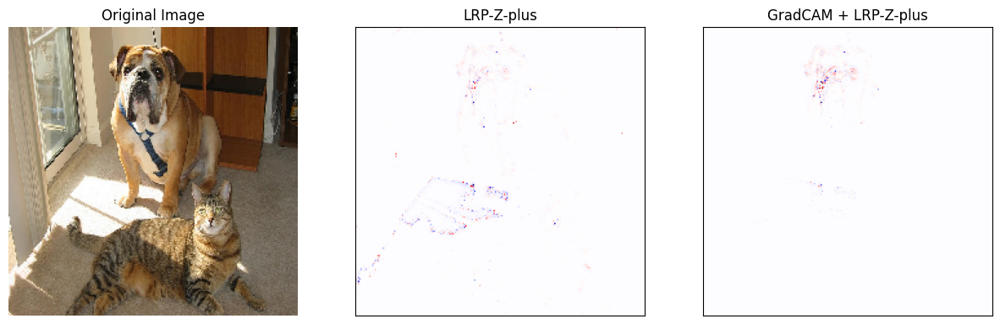

In [ ]:
plt.figure(figsize=(15, 10))

plt.subplot(131)
plt.title('Original Image')
plt.axis('off')
plt.imshow(keras.utils.load_img(img_path, target_size=img_size))

plt.subplot(132)
plt.title('LRP-Z-plus')
plt.xticks([])
plt.yticks([])
plt.imshow(lrp_a_flat_a_single[0])

plt.subplot(133)
plt.title('GradCAM + LRP-Z-plus')
plt.xticks([])
plt.yticks([])
plt.imshow(gradcam_lrp_a_flat[0])

plt.show()

In [ ]:
input_range = (-128, 128)
noise_scale = (input_range[1] - input_range[0]) * 0.1

smoothgrad_analyzer = innvestigate.create_analyzer("smoothgrad", model_wo_sm,augment_by_n= 16,
                             noise_scale=noise_scale,
                             postprocess= "square")

smoothgrad_a = smoothgrad_analyzer.analyze(preprocessed_img)

smoothgrad_a_single = iutils.postprocess_images(smoothgrad_a, color_conversion, channels_first)
smoothgrad_a_single = ivis.graymap(np.abs(smoothgrad_a_single), input_is_positive_only=True)

gradcam_smoothgrad=smoothgrad_a*batch_gcam_mask

gradcam_smoothgrad = iutils.postprocess_images(gradcam_smoothgrad, color_conversion, channels_first)
gradcam_smoothgrad = ivis.graymap(np.abs(gradcam_smoothgrad), input_is_positive_only=True)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


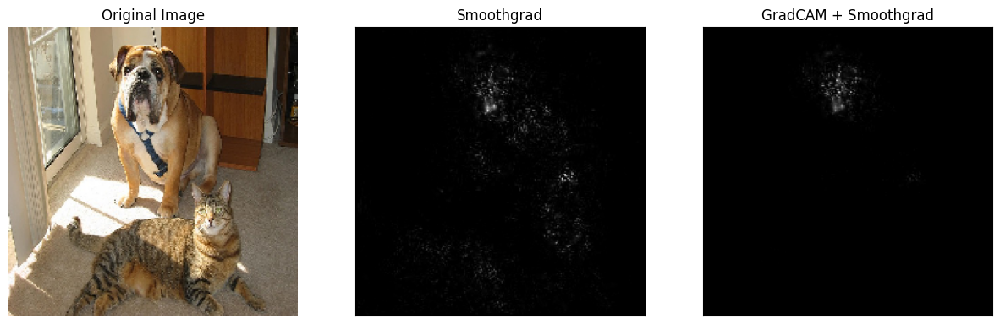

In [ ]:
plt.figure(figsize=(15, 10))

smoothgrad_a_single[0]/=np.max(smoothgrad_a_single[0])
gradcam_smoothgrad[0]/=np.max(gradcam_smoothgrad[0])

plt.subplot(131)
plt.title('Original Image')
plt.axis('off')
plt.imshow(keras.utils.load_img(img_path, target_size=img_size))

plt.subplot(132)
plt.title('Smoothgrad')
plt.xticks([])
plt.yticks([])
plt.imshow(smoothgrad_a_single[0])

plt.subplot(133)
plt.title('GradCAM + Smoothgrad')
plt.xticks([])
plt.yticks([])
plt.imshow(gradcam_smoothgrad[0])
plt.show()

In [ ]:
def make_smoothgrad_heatmap(img_array, model, last_conv_layer_name, pred_index=None, num_samples=50, sigma=0.1):
    # Initialize an accumulator for gradient averages
    avg_grads = 0

    # Create a gradient model
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Iterate through perturbed images and accumulate gradients
    for _ in range(num_samples):
        perturbed_img = add_noise(img_array, sigma)

        with tf.GradientTape() as tape:
            last_conv_layer_output, preds = grad_model(perturbed_img)
            if pred_index is None:
                pred_index = tf.argmax(preds[0])
            class_channel = preds[:, pred_index]

        grads = tape.gradient(class_channel, last_conv_layer_output)
        avg_grads += grads

    # Average the gradients over the iterations
    avg_grads /= num_samples

    # Perform the remaining Grad-CAM operations
    pooled_grads = tf.reduce_mean(avg_grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [ ]:
def add_noise(image, sigma=0.3):
    noise = np.random.normal(loc=0, scale=sigma, size=image.shape)

    noisy_image = image + noise
    #noisy_image = np.clip(noisy_image, 0, 1)

    return noisy_image

def smoothgrad_gradcam(image, model,last_conv_layer_name,pred_index, num_samples=48, sigma=0.3):
    small_map = make_gradcam_heatmap(image, model,last_conv_layer_name,pred_index)
    #gradcam_map=cv2.resize(small_map, dsize=(224, 224),interpolation=cv2.INTER_CUBIC)

    perturbed_maps = []
    for _ in range(num_samples):
        perturbed_image = add_noise(image, sigma)  # Implement a function to add noise to the image
        perturbed_map = make_gradcam_heatmap(perturbed_image, model,last_conv_layer_name,pred_index)
        perturbed_maps.append(perturbed_map)

    # Average the Grad-CAM maps obtained from perturbed images
    averaged_map = np.mean(perturbed_maps, axis=0)

    # Combine Grad-CAM and SmoothGrad
    combined_map = small_map + averaged_map

    # Normalize the combined map for visualization
    combined_map = (combined_map - np.min(combined_map)) / (np.max(combined_map) - np.min(combined_map))

    return small_map,combined_map

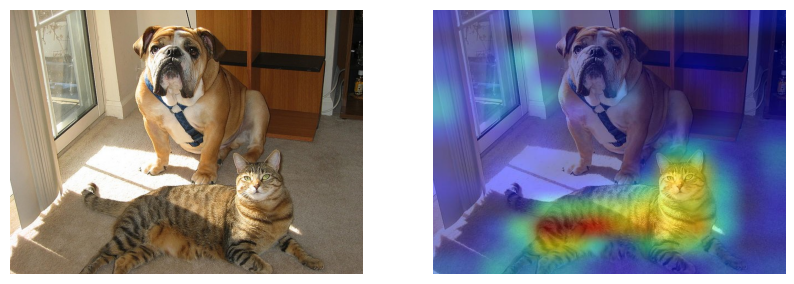

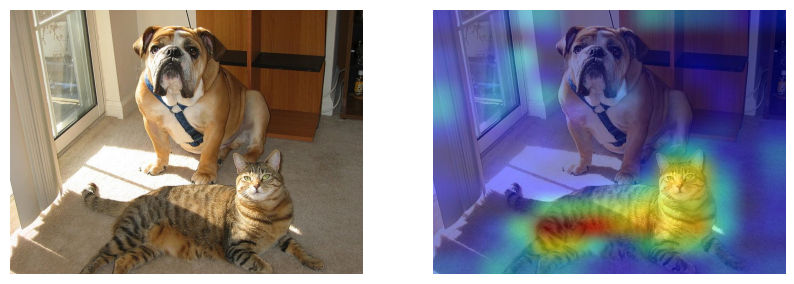

In [ ]:
path="catdog.jpg"
imgg=get_img_array(path, size=img_size)
imgg_array=keras.utils.img_to_array(keras.utils.load_img(path))
#img_array=keras.utils.img_to_array(keras.utils.load_img(img_path))
preprocessed_imgg = preprocess_input(imgg)

gradcam_map=make_gradcam_heatmap(preprocessed_imgg,model,last_conv_layer_name,pred_index=281)
combined_map=make_smoothgrad_heatmap(preprocessed_imgg, model, last_conv_layer_name, pred_index=281)
gradcam_map_img=get_processed_heatmap(gradcam_map, imgg_array)
combined_map_img=get_processed_heatmap(combined_map, imgg_array)
save_and_display_gradcam(path, gradcam_map_img)
save_and_display_gradcam(path, combined_map_img)

# gradcam_map/= np.max(np.abs(gradcam_map))
# combined_map/= np.max(np.abs(combined_map))
# plt.figure(figsize=(15, 10))

# plt.subplot(121)
# plt.title('GradCam Map')
# plt.imshow(gradcam_map, cmap='jet')

# plt.subplot(122)
# plt.title('Smoothgrad GradCam Map')
# plt.imshow(combined_map, cmap='jet')

# plt.show()

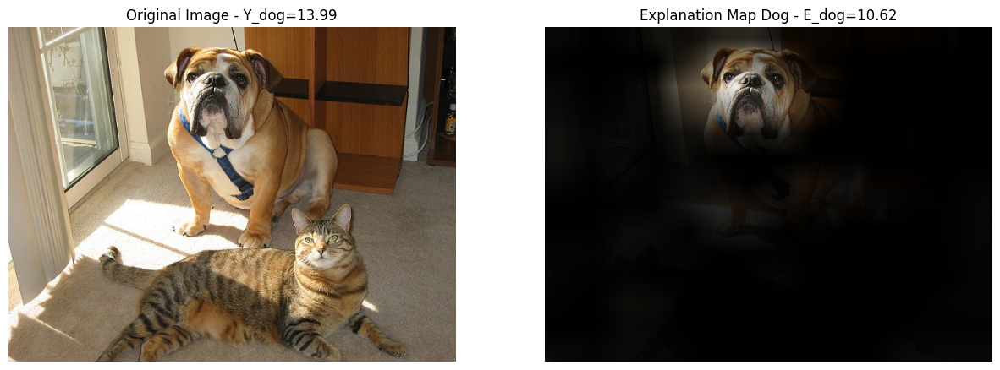

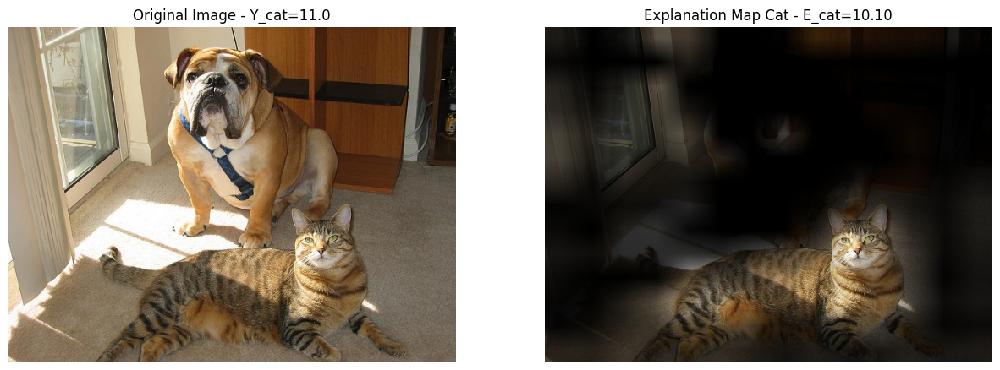

In [ ]:
upsampled_heatmap = cv2.resize(heatmap1, dsize=(img_array.shape[1], img_array.shape[0]),
                         interpolation=cv2.INTER_LINEAR)
upsampled_heatmap /= np.max(np.abs(upsampled_heatmap))
heatmap_mask=np.repeat(upsampled_heatmap[:, :, np.newaxis], 3, axis=2)

explanation_map=heatmap_mask*img_array
explanation_img=keras.utils.array_to_img(explanation_map)

upsampled_heatmap_2 = cv2.resize(heatmap2, dsize=(img_array.shape[1], img_array.shape[0]),
                         interpolation=cv2.INTER_LINEAR)
upsampled_heatmap_2 /= np.max(np.abs(upsampled_heatmap_2))
heatmap_mask_2=np.repeat(upsampled_heatmap_2[:, :, np.newaxis], 3, axis=2)

explanation_map_2=heatmap_mask_2*img_array
explanation_img_2=keras.utils.array_to_img(explanation_map_2)


plt.figure(figsize=(15, 10))

plt.subplot(121)
plt.imshow(image)
plt.title("Original Image - Y_dog=13.99")
plt.axis('off')

plt.subplot(122)
plt.imshow(explanation_img)
plt.title("Explanation Map Dog - E_dog=10.62")
plt.axis('off')

plt.show()

plt.figure(figsize=(15, 10))

plt.subplot(121)
plt.imshow(image)
plt.title("Original Image - Y_cat=11.0")
plt.axis('off')

plt.subplot(122)
plt.imshow(explanation_img_2)
plt.title("Explanation Map Cat - E_cat=10.10")
plt.axis('off')

plt.show()

In [ ]:
def get_resized_image(image):
  resized_image=image.resize(img_size)
  array=keras.utils.img_to_array(resized_image)
  array = np.expand_dims(array, axis=0)
  return array

In [ ]:
preprocessed_explanation = preprocess_input(get_resized_image(explanation_img))

preds_exp = model.predict(preprocessed_explanation)
decoded_exp=decode_predictions(preds_exp, top=1)[0]
print("Predicted:", decoded_exp)

1/1 [==============================] - 1s 1s/step
Predicted: [('n02108089', 'boxer', 10.626827)]


In [ ]:
preprocessed_explanation_2 = preprocess_input(get_resized_image(explanation_img_2))

preds_exp = model.predict(preprocessed_explanation_2)
decoded_exp=decode_predictions(preds_exp, top=1)[0]
print("Predicted:", decoded_exp)

1/1 [==============================] - 0s 44ms/step
Predicted: [('n02124075', 'Egyptian_cat', 10.106649)]


In [ ]:
!git clone https://github.com/ndb796/Small-ImageNet-Validation-Dataset-1000-Classes
%cd Small-ImageNet-Validation-Dataset-1000-Classes

Cloning into 'Small-ImageNet-Validation-Dataset-1000-Classes'...
remote: Enumerating objects: 6022, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 6022 (delta 1), reused 0 (delta 0), pack-reused 6016
Receiving objects: 100% (6022/6022), 624.87 MiB | 15.83 MiB/s, done.
Resolving deltas: 100% (2/2), done.
Updating files: 100% (5005/5005), done.
/content/drive/MyDrive/GradCam/TestImages/Small-ImageNet-Validation-Dataset-1000-Classes


In [ ]:
def compute_dataset_average_drop(image_scores,explanation_scores):
  return np.sum(np.array([np.max([0,yc-oc])/yc for yc, oc in zip(image_scores,explanation_scores)]))/len(image_scores)*100

def compute_dataset_increase_in_confidence(image_scores,explanation_scores):
  return np.sum(np.array([1 if yc<oc else 0 for yc, oc in zip(image_scores,explanation_scores)]))/len(image_scores)*100

In [ ]:
def make_explanation_img(image, heatmap):
  img_array=keras.utils.img_to_array(image)
  upsampled_heatmap = cv2.resize(heatmap, dsize=(img_array.shape[1], img_array.shape[0]),
                         interpolation=cv2.INTER_LINEAR)
  upsampled_heatmap /= np.max(np.abs(upsampled_heatmap))
  heatmap_mask=np.repeat(upsampled_heatmap[:, :, np.newaxis], 3, axis=2)

  explanation_map=heatmap_mask*img_array
  explanation_img=keras.utils.array_to_img(explanation_map)
  return explanation_img

In [ ]:
def get_all_file_paths(directory):
    file_paths = []
    for root, _, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            file_paths.append(file_path)
    return file_paths

In [ ]:
def compute_prediction_scores(model_builder, preprocess_input,decode_predictions,last_conv_layer_name,img_size,data_dir):
  paths=get_all_file_paths(data_dir)

  model = model_builder(weights="imagenet")
  model.layers[-1].activation = None

  image_scores=[]
  explanation_scores=[]
  accuracy=0

  for index, path in enumerate(paths):
    imgpath=path[2:]
    correct_class_index=int(imgpath.split('/')[2])
    image = Image.open(imgpath)
    image_array=keras.utils.img_to_array(image)
    resized_image_array=get_img_array(imgpath, size=img_size)
    preprocessed_image = preprocess_input(resized_image_array)

    preds = model.predict(preprocessed_image)
    decoded_preds=decode_predictions(preds, top=1)[0]

    sorted_indices = np.argsort(preds[0])[::-1]
    predicted_class_index=sorted_indices[0]

    if predicted_class_index==correct_class_index:
       image_scores.append(decoded_preds[0][2])
       accuracy+=1

       heatmap = make_gradcam_heatmap(preprocessed_image, model, last_conv_layer_name, predicted_class_index)

       explanation_image=make_explanation_img(image,heatmap)
       resized_explanation_image_array=get_resized_image(explanation_image)
       preprocessed_explanation_image=preprocess_input(resized_explanation_image_array)

       exp_preds=model.predict(preprocessed_explanation_image)
       exp_score=exp_preds[0][predicted_class_index]
       explanation_scores.append(exp_score)

    if index%50==0:
      print(f"Computed for {index}/{len(paths)} images")

  accuracy=accuracy/len(paths)*100

  return image_scores, explanation_scores, accuracy


In [ ]:
vgg_model_builder = keras.applications.vgg16.VGG16
resnet_model_builder = keras.applications.resnet50.ResNet50

vgg_preprocess_input = keras.applications.vgg16.preprocess_input
vgg_decode_predictions = keras.applications.vgg16.decode_predictions

resnet_preprocess_input = keras.applications.resnet50.preprocess_input
resnet_decode_predictions = keras.applications.resnet50.decode_predictions

vgg_last_conv_layer_name = "block5_conv3"
resnet_last_conv_layer_name = "conv5_block3_out"

img_size = (224, 224)
data_dir = './Small-ImageNet-Validation-Dataset-1000-Classes/ILSVRC2012_img_val_subset'

In [ ]:
vgg_image_scores,vgg_explanation_scores, vgg_accuracy=compute_prediction_scores(vgg_model_builder,vgg_preprocess_input,vgg_decode_predictions,vgg_last_conv_layer_name,img_size,data_dir)

Datele de ieșire de afișat au fost trunchiate la ultimele 5000 linii.
1/1 [==============================] - 0s 23ms/step
Computed for 2000/5000 images
1/1 [==============================] - 0s 31ms/step
Computed for 2050/5000 images
1/1 [==============================] - 0s 20ms/step
Computed for 2100/5000 images
1/1 [==============================] - 0s 22ms/step
Computed for 2150/5000 images
1/1 [==============================] - 0s 19ms/step
Computed for 2200/5000 images
1/1 [==============================] - 0s 27ms/step
Computed for 2250/5000 images
1/1 [==============================] - 0s 18ms/step
Computed for 2300/5000 images
1/1 [==============================] - 0s 19ms/step
Computed for 2350/5000 images
1/1 [==============================] - 0s 18ms/step
Computed for 2400/5000 images
1/1 [==============================] - 0s 27ms/step
Computed for 2450/5000 images
1/1 [==============================] - 0s 18ms/step
Computed for 2500/5000 images
1/1 [=======================

In [ ]:
vgg_average_drop=compute_dataset_average_drop(vgg_image_scores,vgg_explanation_scores)
vgg_increase_in_confidence=compute_dataset_increase_in_confidence(vgg_image_scores,vgg_explanation_scores)

print(f"VGG16 top1 accuracy: {np.round(vgg_accuracy,2)} %")
print(f"VGG16 average drop: {np.round(vgg_average_drop,2)} %")
print(f"VGG16 increase in confidence: {np.round(vgg_increase_in_confidence,2)} %")

VGG16 top1 accuracy: 65.18 %
VGG16 average drop: 36.1 %
VGG16 increase in confidence: 5.03 %


In [ ]:
resnet_image_scores,resnet_explanation_scores,resnet_accuracy=compute_prediction_scores(resnet_model_builder,resnet_preprocess_input,resnet_decode_predictions,resnet_last_conv_layer_name,img_size,data_dir)

Datele de ieșire de afișat au fost trunchiate la ultimele 5000 linii.
1/1 [==============================] - 0s 21ms/step
Computed for 2100/5000 images
1/1 [==============================] - 0s 21ms/step
Computed for 2150/5000 images
1/1 [==============================] - 0s 21ms/step
Computed for 2200/5000 images
1/1 [==============================] - 0s 25ms/step
Computed for 2250/5000 images
1/1 [==============================] - 0s 26ms/step
Computed for 2300/5000 images
1/1 [==============================] - 0s 26ms/step
Computed for 2350/5000 images
1/1 [==============================] - 0s 24ms/step
Computed for 2400/5000 images
1/1 [==============================] - 0s 24ms/step
Computed for 2450/5000 images
1/1 [==============================] - 0s 21ms/step
Computed for 2500/5000 images
1/1 [==============================] - 0s 22ms/step
Computed for 2550/5000 images
1/1 [==============================] - 0s 24ms/step
Computed for 2600/5000 images
1/1 [=======================

In [ ]:
resnet_average_drop=compute_dataset_average_drop(resnet_image_scores,resnet_explanation_scores)
resnet_increase_in_confidence=compute_dataset_increase_in_confidence(resnet_image_scores,resnet_explanation_scores)

print(f"ResNet50 top1 accuracy: {np.round(resnet_accuracy,2)} %")
print(f"ResNet50 average drop: {np.round(resnet_average_drop,2)} %")
print(f"ResNet50 increase in confidence: {np.round(resnet_increase_in_confidence,2)} %")

ResNet50 top1 accuracy: 69.22 %
ResNet50 average drop: 16.9 %
ResNet50 increase in confidence: 23.69 %


In [ ]:
def plot_gradcam(img_path, jet_heatmap_1,jet_heatmap_2,label,pred_1,pred_2, cam_path="cam.jpg", alpha=1):

    im = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(im)

    superimposed_img_1 = jet_heatmap_1 * alpha + img
    superimposed_img_1 = keras.utils.array_to_img(superimposed_img_1)

    superimposed_img_2 = jet_heatmap_2 * alpha + img
    superimposed_img_2 = keras.utils.array_to_img(superimposed_img_2)

    superimposed_img_1.save(img_path+'_vgg_'+cam_path)
    image1 = Image.open(img_path+'_vgg_'+cam_path)

    superimposed_img_2.save(img_path+'_resnet_'+cam_path)
    image2 = Image.open(img_path+'_resnet_'+cam_path)

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(im)
    plt.title(f"Original Image: {label}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(image1)
    plt.title(f"VGG16 pred: {pred_1}")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(image2)
    plt.title(f"ResNet50 pred: {pred_2}")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

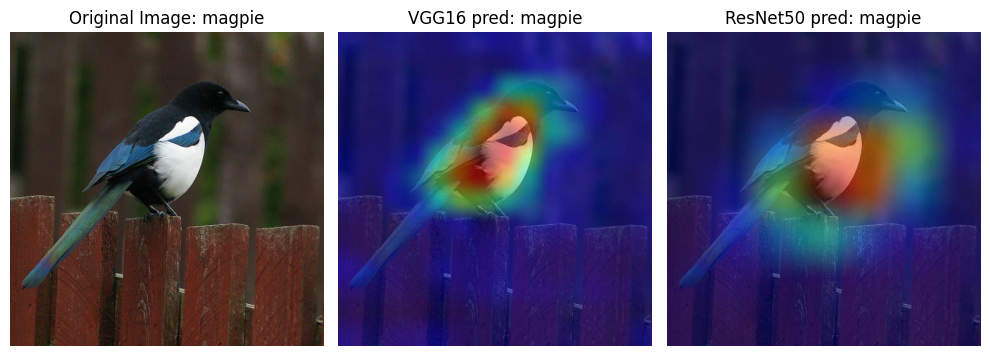

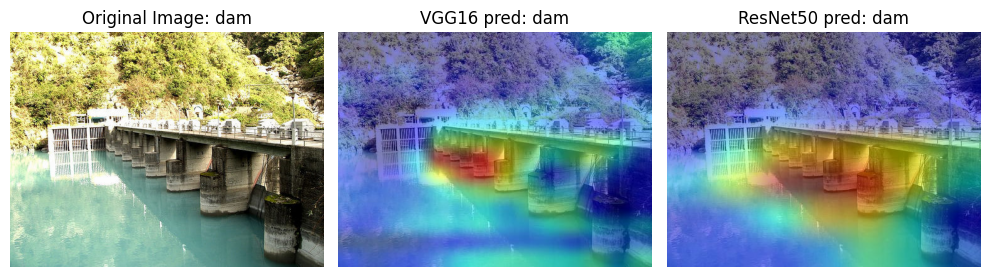

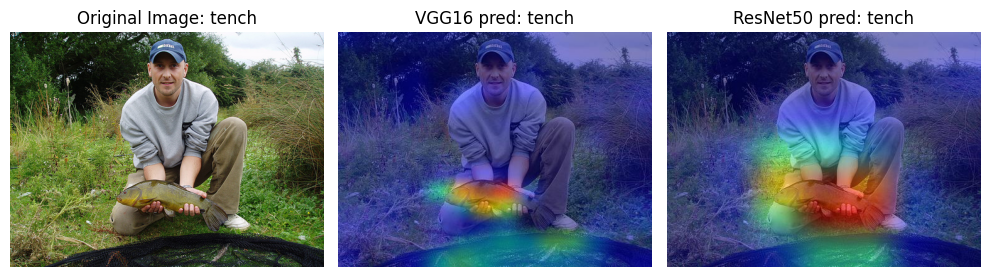

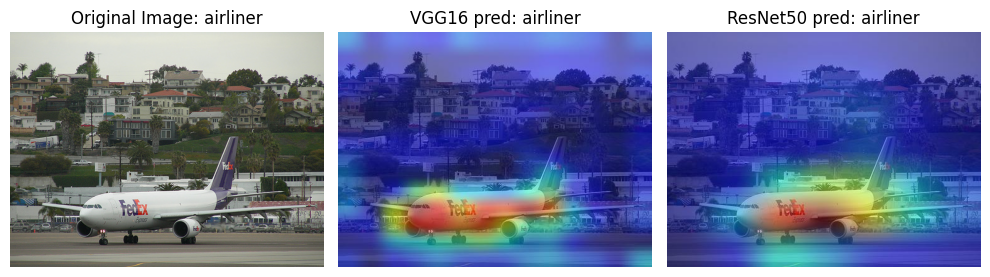

In [ ]:
img_paths=['Small-ImageNet-Validation-Dataset-1000-Classes/ILSVRC2012_img_val_subset/18/ILSVRC2012_val_00003665.JPEG',
           'Small-ImageNet-Validation-Dataset-1000-Classes/ILSVRC2012_img_val_subset/525/ILSVRC2012_val_00004828.JPEG',
           'Small-ImageNet-Validation-Dataset-1000-Classes/ILSVRC2012_img_val_subset/0/ILSVRC2012_val_00006697.JPEG',
           'Small-ImageNet-Validation-Dataset-1000-Classes/ILSVRC2012_img_val_subset/404/ILSVRC2012_val_00000631.JPEG']

labels=['magpie','dam','tench','airliner']

vgg_model = vgg_model_builder(weights="imagenet")
vgg_model.layers[-1].activation = None

resnet_model = resnet_model_builder(weights="imagenet")
resnet_model.layers[-1].activation = None

for l,p in zip(labels,img_paths):
  im=get_img_array(p, size=img_size)
  im_array=keras.utils.img_to_array(keras.utils.load_img(p))
  preprocessed_vgg = vgg_preprocess_input(im)
  preprocessed_resnet = resnet_preprocess_input(im)

  preds_vgg = vgg_model.predict(preprocessed_vgg, verbose=False)
  sorted_indices_vgg = np.argsort(preds_vgg[0])[::-1]
  decoded_vgg=vgg_decode_predictions(preds_vgg, top=1)[0]
  vgg_index=sorted_indices_vgg[0]
  vgg_label=decoded_vgg[0][1]

  preds_resnet = resnet_model.predict(preprocessed_resnet, verbose=False)
  sorted_indices_resnet = np.argsort(preds_resnet[0])[::-1]
  decoded_resnet=resnet_decode_predictions(preds_resnet, top=1)[0]
  resnet_index=sorted_indices_resnet[0]
  resnet_label=decoded_resnet[0][1]

  heatmap_vgg = make_gradcam_heatmap(preprocessed_vgg, vgg_model, vgg_last_conv_layer_name, vgg_index)
  heatmap_resnet = make_gradcam_heatmap(preprocessed_resnet, resnet_model, resnet_last_conv_layer_name, resnet_index)

  upsampled_heatmap_vgg=get_processed_heatmap(heatmap_vgg, im_array)
  upsampled_heatmap_resnet=get_processed_heatmap(heatmap_resnet, im_array)

  plot_gradcam(p, upsampled_heatmap_vgg,upsampled_heatmap_resnet,l,vgg_label,resnet_label)



